In [1]:
import json
import cv2
from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import os
import random
import copy

In [2]:
data_path = '/mmdetection/data/coco_datasets/datasets/carpart_collection/annotations/total.json'
total_data = json.load(open(data_path))
total_data.keys()

dict_keys(['info', 'licences', 'images', 'annotations', 'categories'])

In [3]:
print(total_data['categories'])

[{'supercategory': 'Carparts', 'id': 0, 'name': '__background'}, {'supercategory': 'Carparts', 'id': 1, 'name': 'sli_side_turn_light'}, {'supercategory': 'Carparts', 'id': 2, 'name': 'tyre'}, {'supercategory': 'Carparts', 'id': 3, 'name': 'alloy_wheel'}, {'supercategory': 'Carparts', 'id': 4, 'name': 'hli_head_light'}, {'supercategory': 'Carparts', 'id': 5, 'name': 'hood'}, {'supercategory': 'Carparts', 'id': 6, 'name': 'fwi_windshield'}, {'supercategory': 'Carparts', 'id': 7, 'name': 'flp_front_license_plate'}, {'supercategory': 'Carparts', 'id': 8, 'name': 'door'}, {'supercategory': 'Carparts', 'id': 9, 'name': 'mirror'}, {'supercategory': 'Carparts', 'id': 10, 'name': 'handle'}, {'supercategory': 'Carparts', 'id': 11, 'name': 'qpa_quarter_panel'}, {'supercategory': 'Carparts', 'id': 12, 'name': 'fender'}, {'supercategory': 'Carparts', 'id': 13, 'name': 'grille'}, {'supercategory': 'Carparts', 'id': 14, 'name': 'fbu_front_bumper'}, {'supercategory': 'Carparts', 'id': 15, 'name': 'roc

In [3]:
carpart_classes = []
for cat in total_data['categories']:
    carpart_classes.append(cat['name'])
for i,clss in enumerate(carpart_classes):
    print(i, '-', clss)

0 - __background
1 - sli_side_turn_light
2 - tyre
3 - alloy_wheel
4 - hli_head_light
5 - hood
6 - fwi_windshield
7 - flp_front_license_plate
8 - door
9 - mirror
10 - handle
11 - qpa_quarter_panel
12 - fender
13 - grille
14 - fbu_front_bumper
15 - rocker_panel
16 - rbu_rear_bumper
17 - roof
18 - blp_back_license_plate
19 - window
20 - rwi_rear_windshield
21 - tail_gate
22 - tli_tail_light
23 - fbe_fog_light_bezel
24 - fli_fog_light
25 - fuel_tank_door
26 - lli_low_bumper_tail_light
27 - exhaust
28 - bpn_bed_panel
29 - mpa_mid_panel
30 - rpa_rear_panel
31 - rdo_rear_door
32 - A_pillar
33 - B_pillar
34 - C_pillar


In [4]:
def creat_img_carpart_mapping():
    mapping_list = []
    for cls in carpart_classes:
        mapping_name = 'imgTo'+ str(cls)
        locals()[mapping_name] = defaultdict(list)
        for ann in total_data['annotations']:
            if carpart_classes[ann['category_id']] == str(cls):
                locals()[mapping_name][ann['image_id']].append(ann)
        mapping_list.append(locals()[mapping_name])
    return mapping_list



In [42]:
mapping_list = creat_img_carpart_mapping()
print(len(mapping_list))

35


In [5]:
print(list(total_data['images'])[0])
print(len(list(total_data['images'])))

{'id': 716, 'license': 4, 'coco_url': 'coco.org', 'flickr_url': 'flickr.org', 'task_name': 'nothing', 'url': 'https://s3.amazonaws.com/mc-ai/dataset/india/20190409/imgs/218/DSCN2721.JPG', 'width': 1024, 'height': 768, 'file_name': 'https:__s3.amazonaws.com_mc-ai_dataset_india_20190409_imgs_218_DSCN2721.JPG', 'date_captured': '2013-12-15 02:41:52'}
8470


In [6]:
print(list(total_data['annotations'])[0])
print(len(list(total_data['annotations'])))

{'id': 1, 'category_id': 8, 'iscrowd': 0, 'segmentation': [[708.613628659112, 386.39745000820346, 646.0209657258225, 390.0328308921032, 601.3394003730278, 395.61802656120256, 555.7269690753834, 403.0649541200017, 511.04540372258873, 412.37361356850056, 481.2576934873923, 418.88967518244976, 466.3638383697941, 423.54400490669923, 453.33171514189564, 431.92179841034823, 440.29959191399723, 440.29959191399723, 430.06006652064843, 449.6082513624961, 408.650149789101, 475.672497818293, 380.72417144360435, 520.3540631710877, 362.1068525466066, 554.7961031305334, 347.2129974290084, 590.1690090348293, 333.25000825626006, 626.4727808839749, 323.9413488077612, 660.9148208434208, 313.7018234144124, 721.4211072586635, 310.9092255798627, 773.5496001702572, 310.9092255798627, 822.8854952473014, 310.9092255798627, 873.1522562691953, 313.7018234144124, 929.0042129601886, 321.1487509732115, 973.6857783129833, 342.55866770475893, 1007.1969523275792, 368.6229141605558, 1042.569858231875, 392.825428726652

In [5]:
print('average number of carpart masks per image: ', 117119/8470)

average number of carpart masks per image:  13.827508854781582


In [7]:
imgToAnns = defaultdict(list)
for ann in total_data['annotations']:
    imgToAnns[ann['image_id']].append(ann)


In [8]:

print(len(imgToAnns.keys()))

8470


# Distribution of number of carpart per image

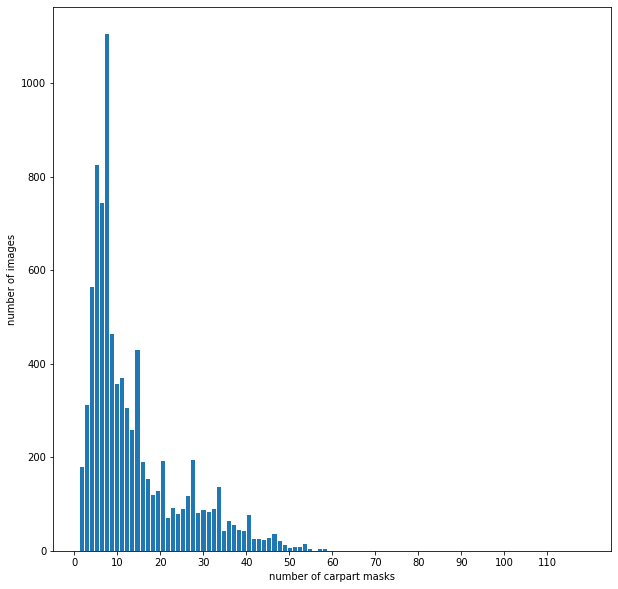

In [11]:
# Distribution of number car parts in images
img_ids = list(imgToAnns.keys())
carparts_density = [len(imgToAnns[img_id]) for img_id in img_ids]
plt.figure(figsize=(10,10))
plt.hist(carparts_density, 100,edgecolor='w')
plt.xticks(np.arange(0,max(carparts_density),10))
plt.xlabel('number of carpart masks')
plt.ylabel('number of images')
plt.show()

In [11]:
print(max(carparts_density))

119


# Visualization

In [12]:
np.random.seed(2)
colors = []
for i in range (max(carparts_density)):
    
    colors.append((np.random.random((1,3))*0.6+0.4).tolist()[0])

In [13]:
def draw_masks(num, anno_type):
    img_ids = random.sample(list(anno_type.keys()), num**2) 
    fig, axs = plt.subplots(num, num, figsize=(15,15))
    
    for i, img_id in enumerate(img_ids):    
        anns = anno_type[img_id]
        
        for img in total_data['images']:
            if img['id'] == img_id:
                img_name = img['file_name']
                break
#         print(img_name)
        img_path = os.path.join('/mmdetection/data/coco_datasets/datasets/carpart_collection/images', img_name)
        I = cv2.imread(img_path)
        axs[int(i/num),i%num].imshow(np.real(I))
        axs[int(i/num),i%num].set_title(img_id)
        # segs = [np.array(ann['segmentation']).reshape(-1,2).astype(int) for ann in anns]
#         ax =  
#         axs[int(i/num),i%num] = plt.gca()
#         axs[int(i/num),i%num].set_autoscale_on(False)
        polygons = []
        color = colors[:len(anns)]
        for ann in anns:
            seg = np.array(ann['segmentation']).reshape(-1,2).astype(int)
            label = carpart_classes[ann['category_id']]
            poly = Polygon(seg)
            polygons.append(poly)

        p = PatchCollection(polygons, facecolor=color, linewidths=0, alpha=0.8)
        p.set_label('abc')
        axs[int(i/num),i%num].add_collection(p)


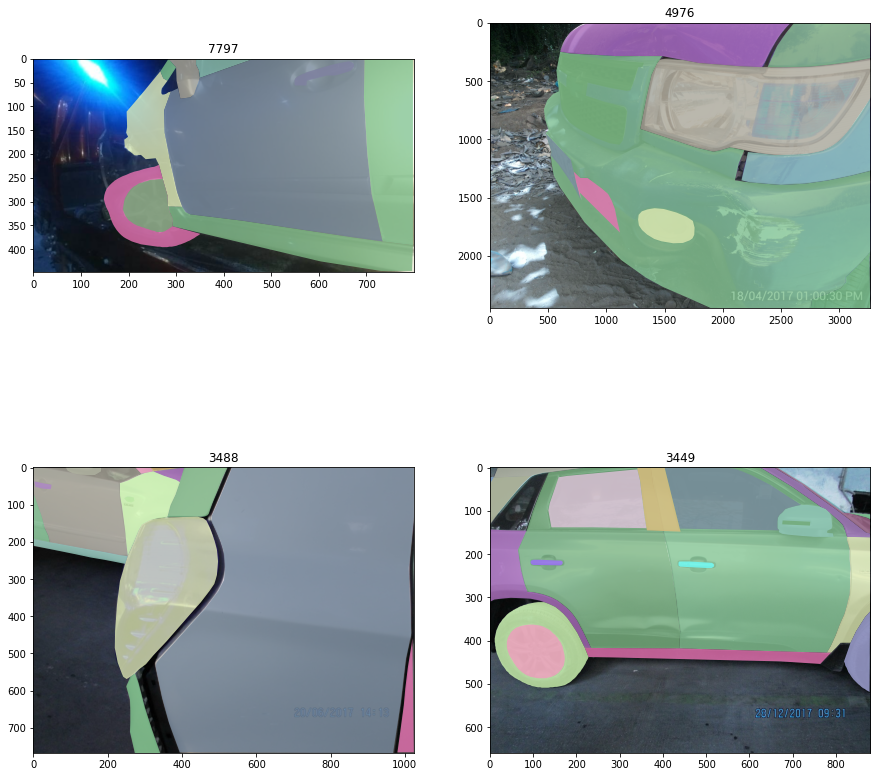

In [14]:
#plot an example of carpart masks on an image
# img_id = random.choice(list(imgToAnns.keys()))
# anns = imgToAnns[img_id]
draw_masks(2, imgToAnns)
    
# cv2.drawContours(I, segs, -1, (0,255,0), 2)
# plt.imshow(I)

## Fender

number of images that have fender annotation:  4507


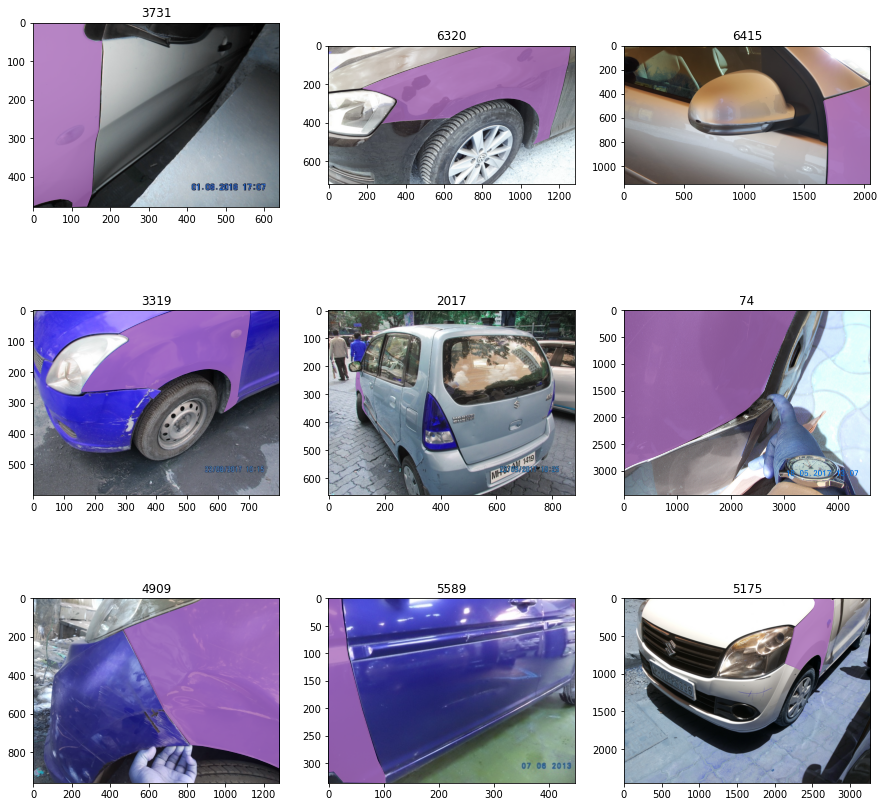

In [51]:
fender_idx = carpart_classes.index('fender')
draw_masks(3, mapping_list[fender_idx])
print('number of images that have fender annotation: ',len(mapping_list[fender_idx].keys()))

In [17]:
# fender outlier, img_id = 8142, 6810, 610

## Vans' observation

### rpa_rear_panel → qpa_quarter_panel?

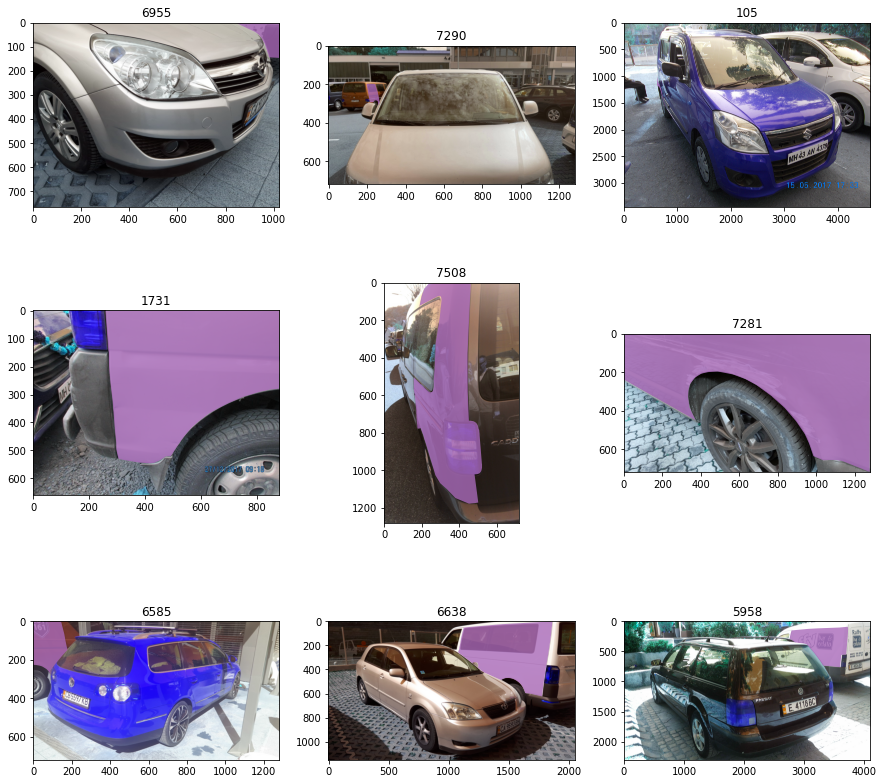

In [53]:
rpa_id = carpart_classes.index('rpa_rear_panel')
draw_masks(3, mapping_list[rpa_id])

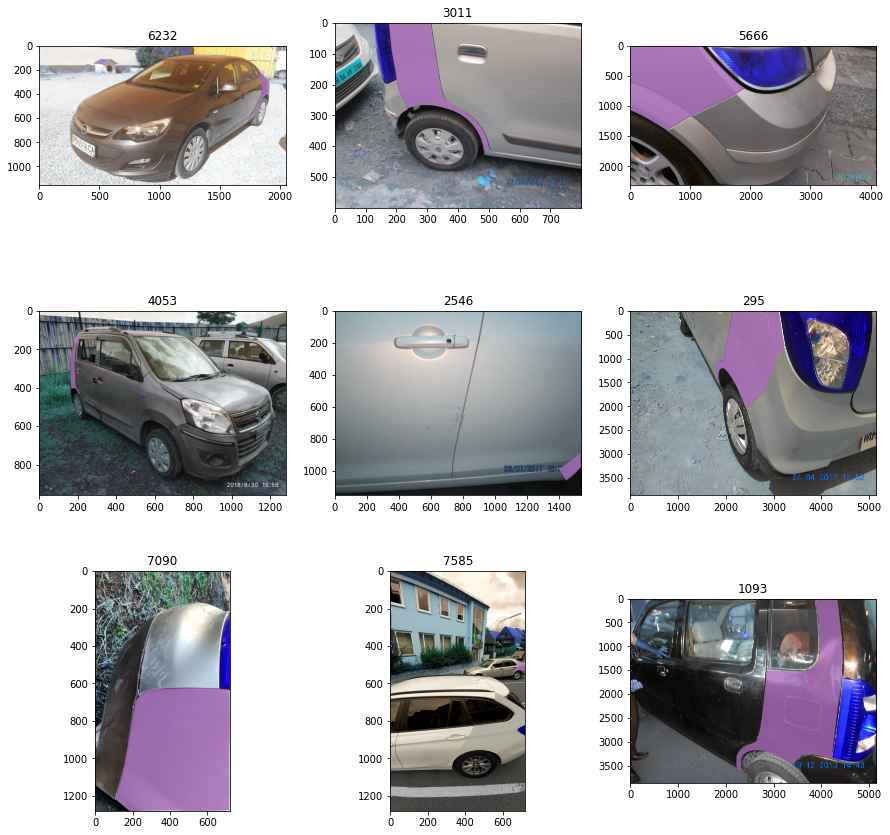

In [52]:
qpa_id = carpart_classes.index('qpa_quarter_panel')
draw_masks(3, mapping_list[qpa_id])

### rdo_rear_door → tail_gate

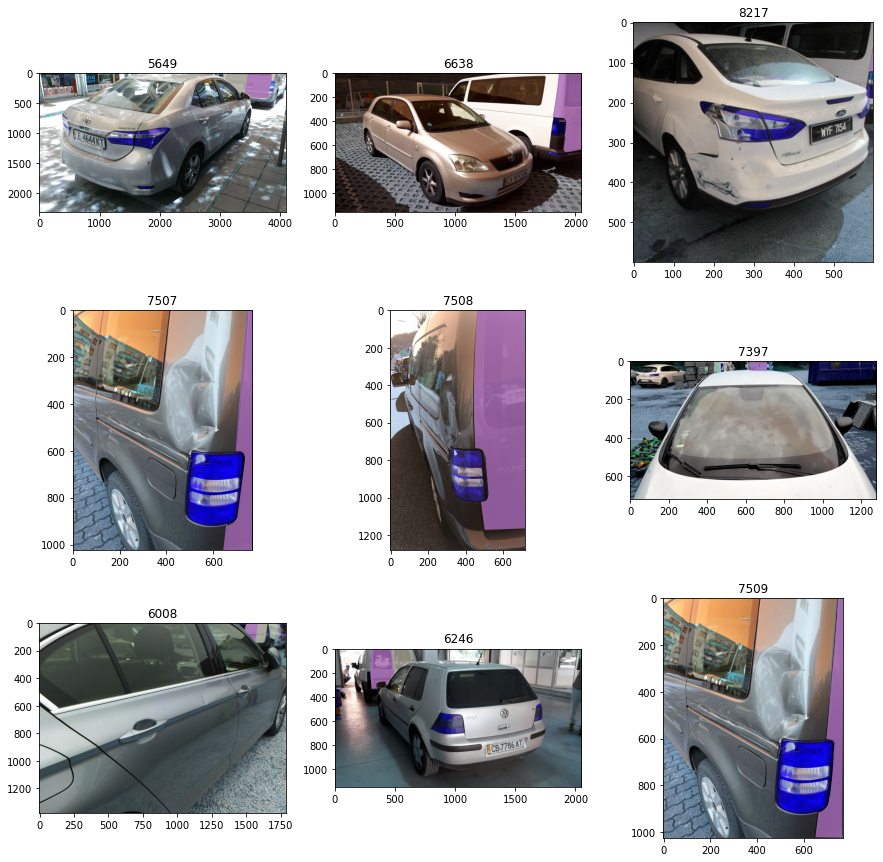

In [58]:
rdo_idx = carpart_classes.index('rdo_rear_door')
draw_masks(3, mapping_list[rdo_idx])

##### Annotator team seems to assume that they annotate rear_door as one side of the door??? 

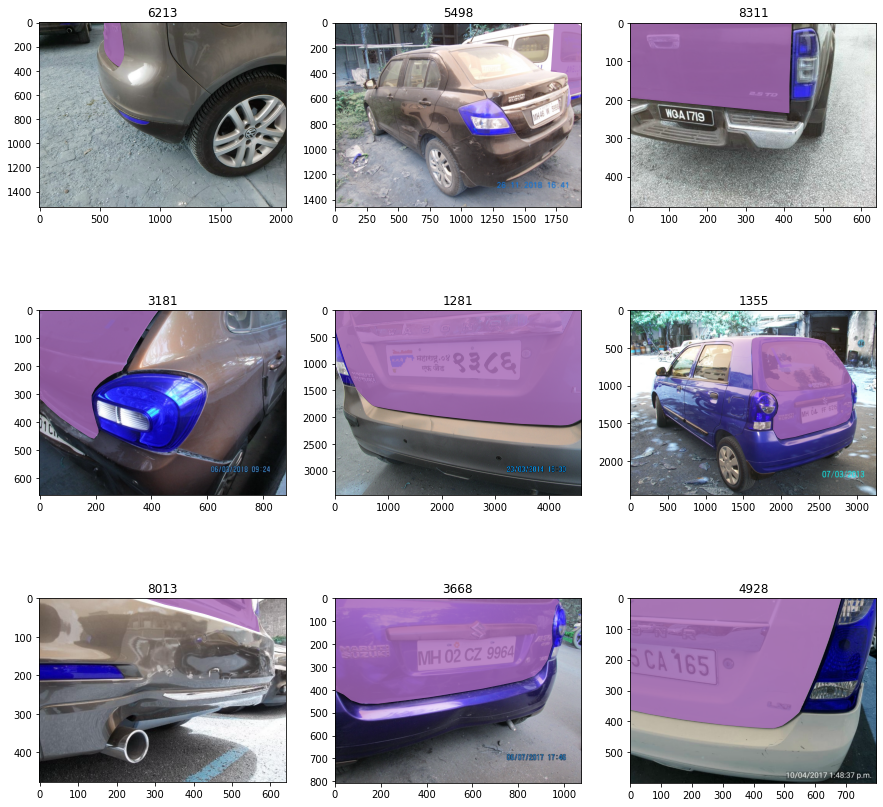

In [59]:
tail_gate_idx = carpart_classes.index('tail_gate')
draw_masks(3, mapping_list[tail_gate_idx])

### mpa_mid_panel → ??

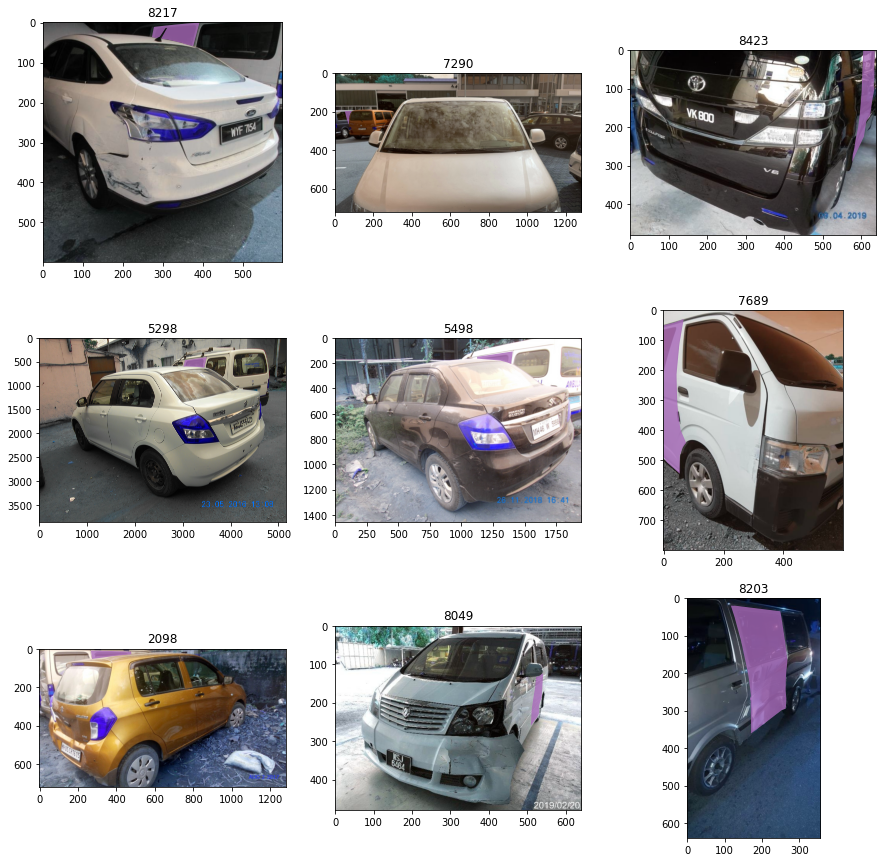

In [61]:
mpa_idx = carpart_classes.index('mpa_mid_panel')
draw_masks(3, mapping_list[mpa_idx])

#### visualize some car-parts to find substitute one for mpa_mid_panel

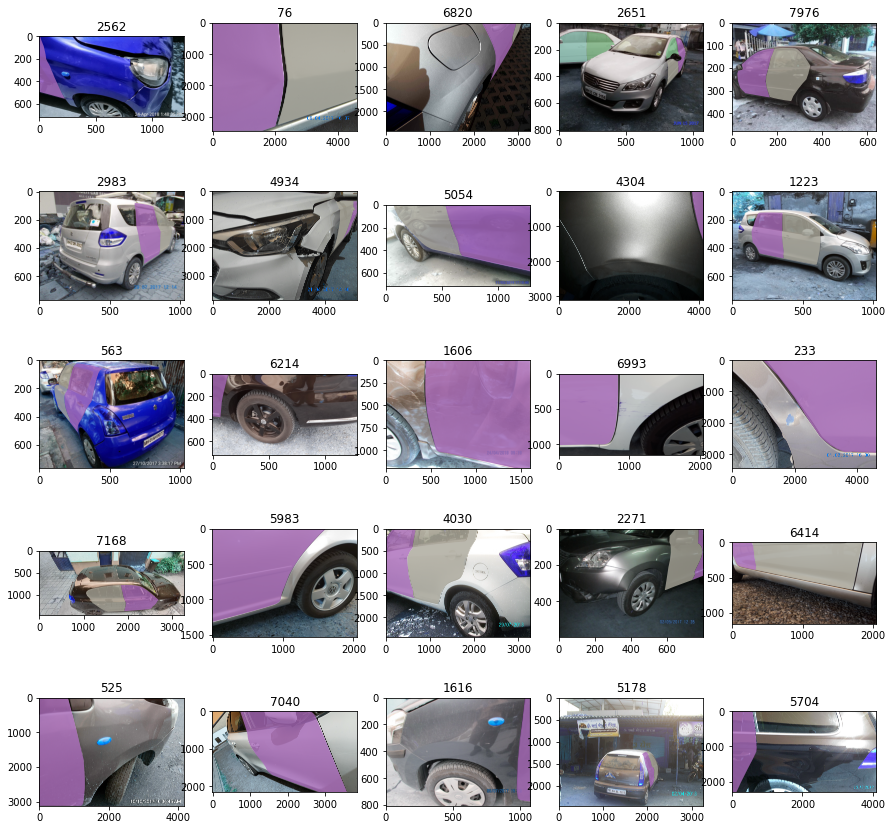

In [83]:
door_idx = carpart_classes.index('door')
draw_masks(5, mapping_list[door_idx])

#### door maybe an alternative for mpa_mid_panel 

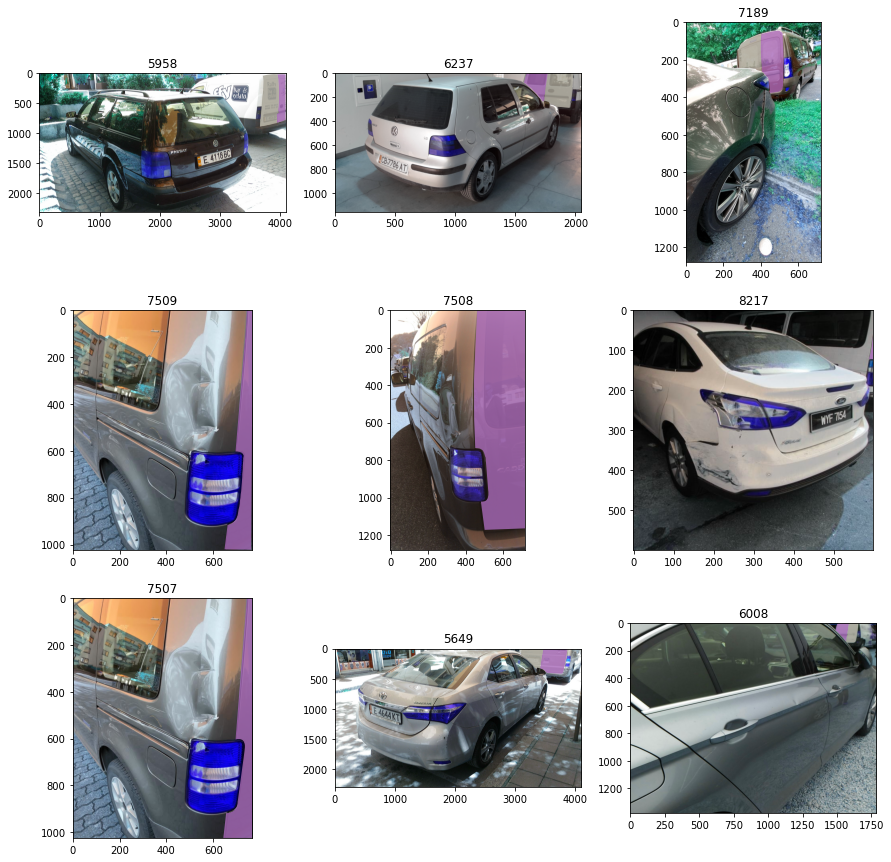

In [82]:
rdo_idx = carpart_classes.index('rdo_rear_door')
draw_masks(3, mapping_list[rdo_idx])

## Truck

### bpn_bed_panel → qpa_quarter_panel

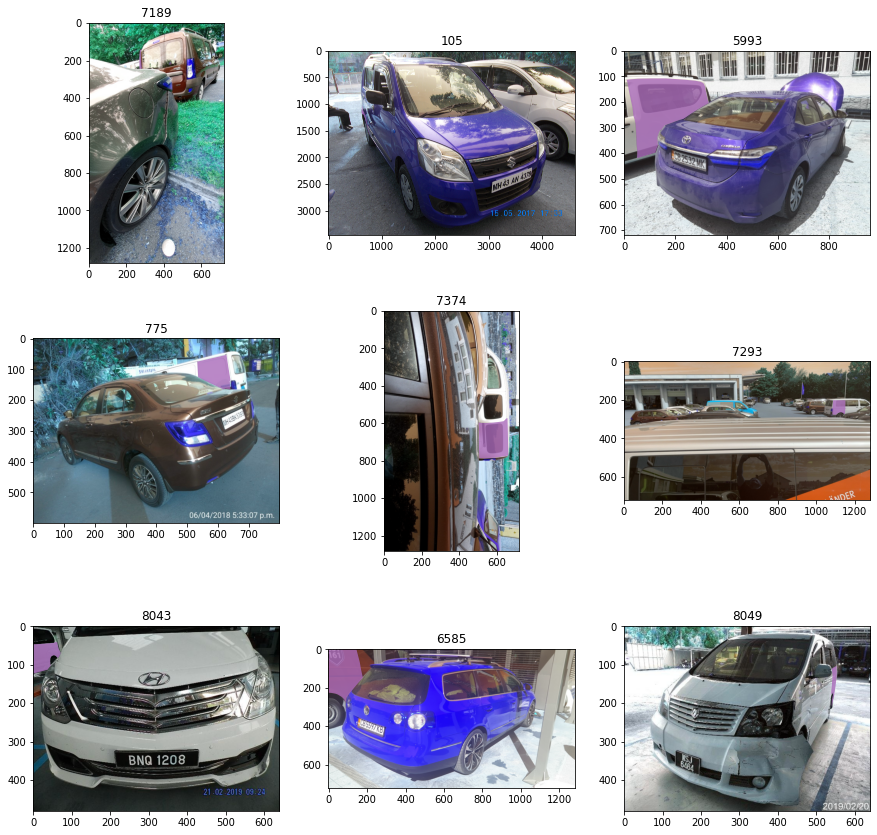

In [75]:
rpa_idx = carpart_classes.index('rpa_rear_panel')
draw_masks(3, mapping_list[rpa_idx])

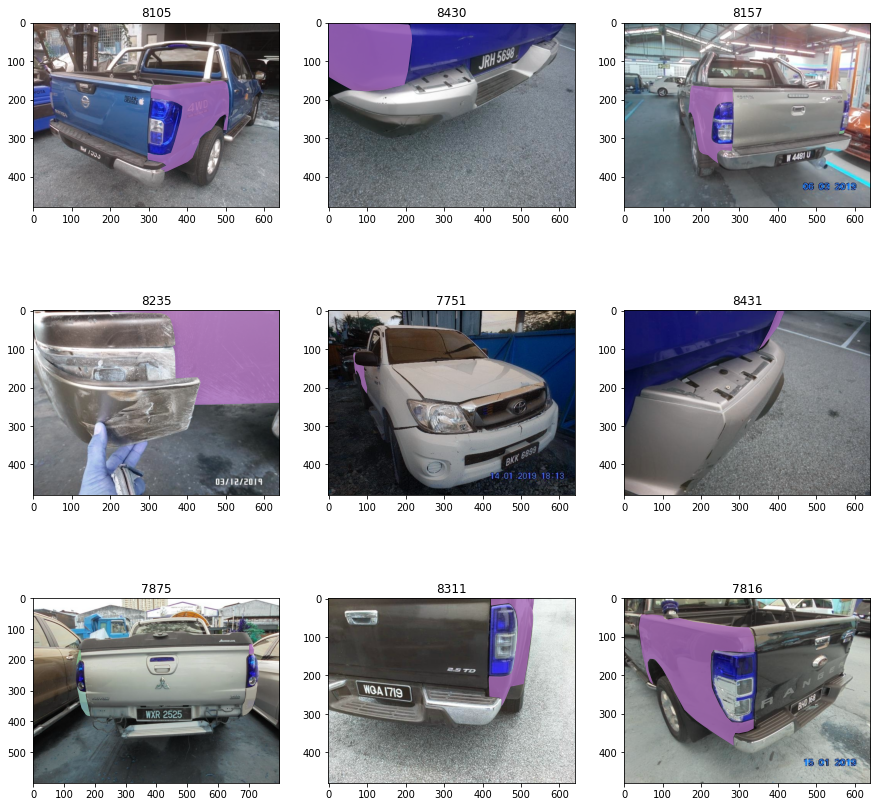

In [76]:
bpn_idx = carpart_classes.index('bpn_bed_panel')
draw_masks(3, mapping_list[bpn_idx])

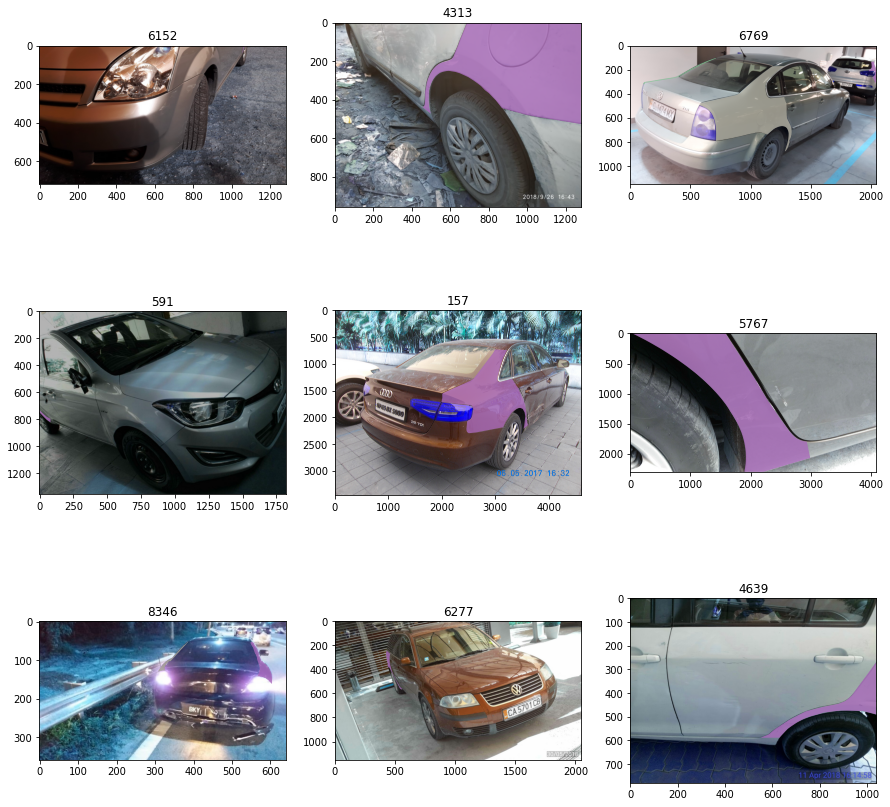

In [78]:
qpa_idx = carpart_classes.index('qpa_quarter_panel')
draw_masks(3, mapping_list[qpa_idx])

### sli_side_turn_light observation

In [ ]:
sli_idx = carpart_classes.index('sli_side_turn_light')

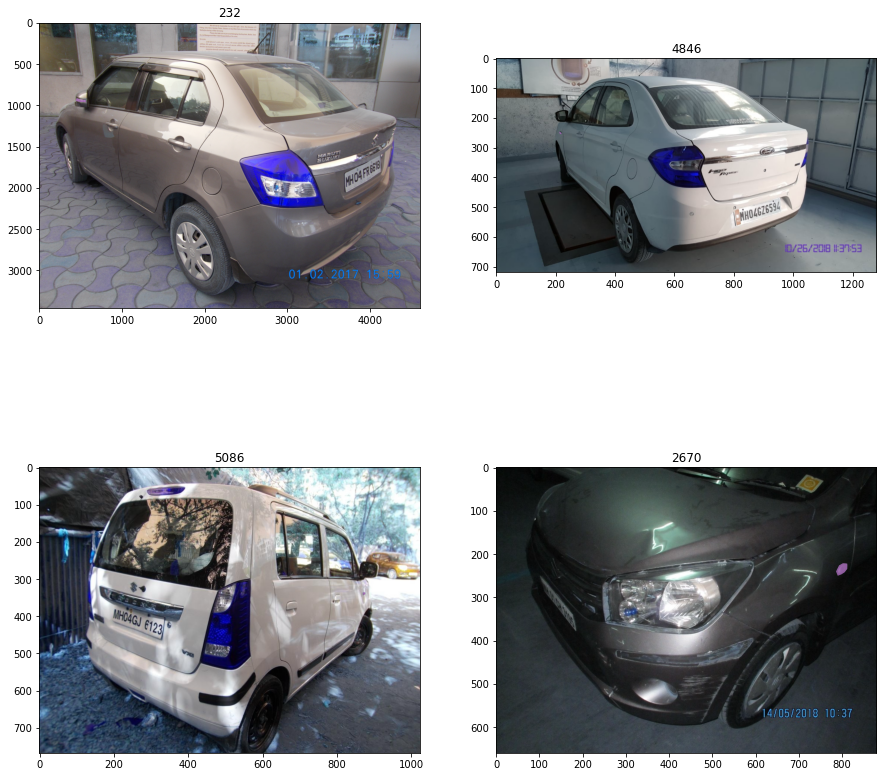

In [98]:
draw_masks(2, mapping_list[sli_idx])

#### side turn light is on either fender or mirror
sli_side_turn_light on mirror on fender: are mostly in ellipse shape,
sli on mirror: are mostly in rectangle shape

# Merge all pillar as 1 categories : 'A_pillar','B_pillar','C_pillar' as pillar'

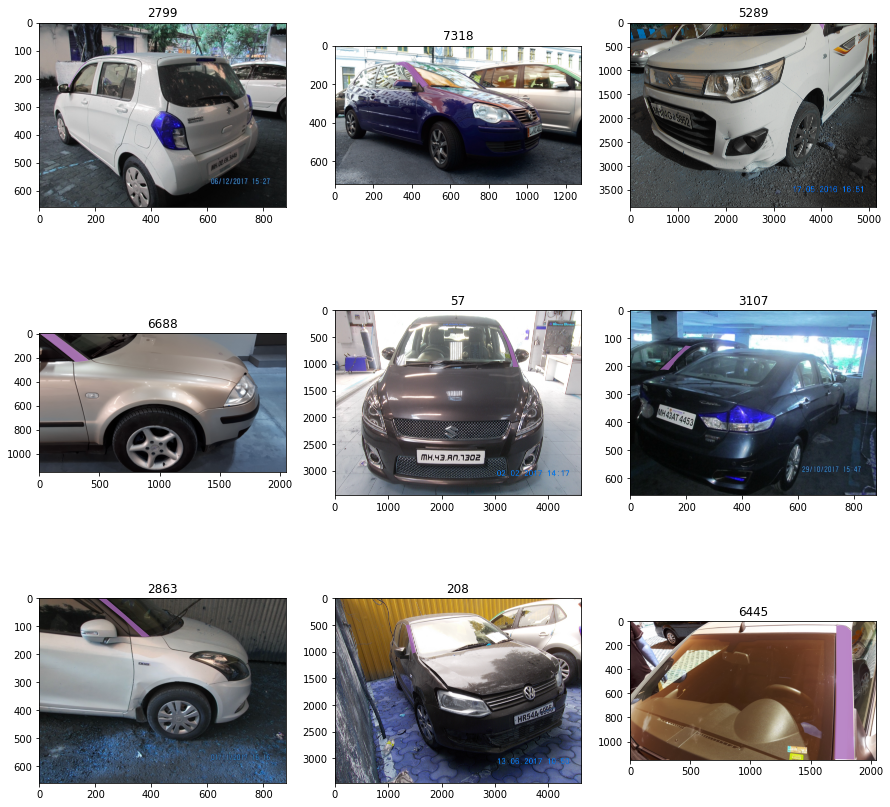

In [99]:
pillar_a_idx = carpart_classes.index('A_pillar')
draw_masks(3, mapping_list[pillar_a_idx])

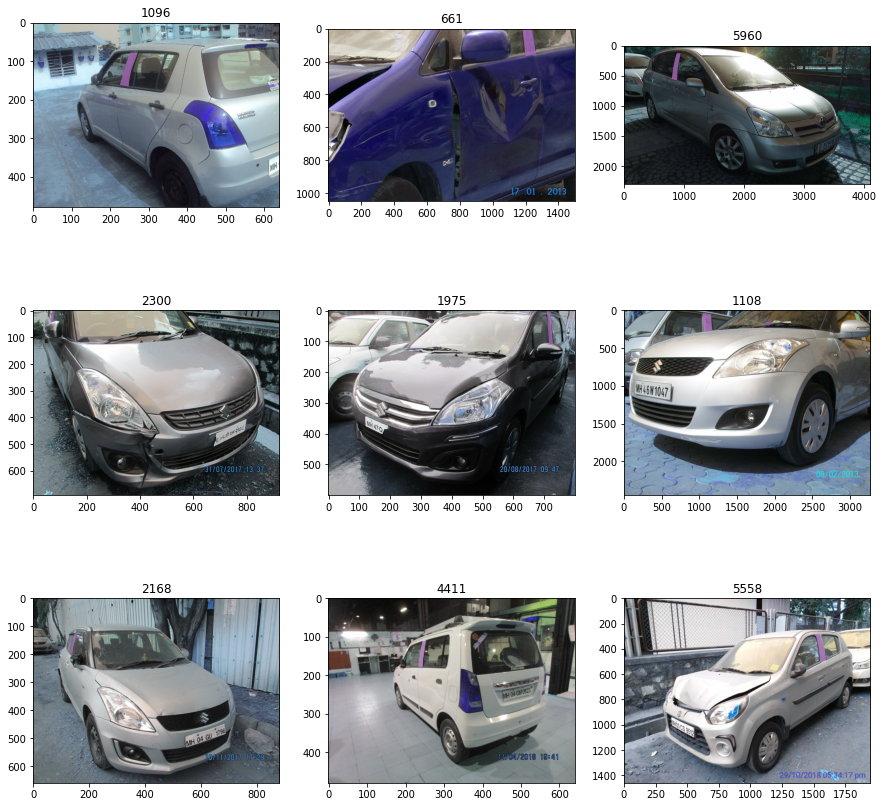

In [100]:
pillar_b_idx = carpart_classes.index('B_pillar')
draw_masks(3, mapping_list[pillar_b_idx])

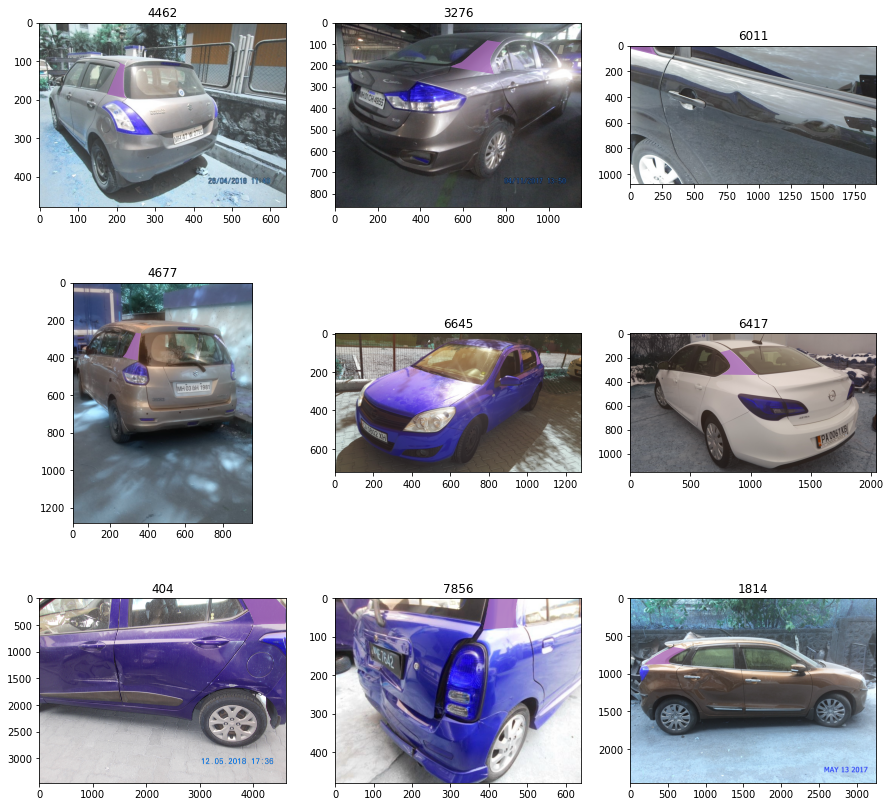

In [101]:
pillar_c_idx = carpart_classes.index('C_pillar')
draw_masks(3, mapping_list[pillar_c_idx])

## create new converted annotation file: v1-with 'pillar'

In [12]:
new_total_data_v1 = copy.deepcopy(total_data)
new_total_data_v1['annotations'] = []
new_total_data_v1['categories'] = []

# update categories dictionary
for cat in total_data['categories']:
    if cat['name'] == 'A_pillar':
        cat['name'] = 'pillar'
    if cat['name'] not in ['B_pillar', 'C_pillar', 'rpa_rear_panel', 
                           'rdo_rear_door', 'mpa_mid_panel', 'bpn_bed_panel']:
        new_total_data_v1['categories'].append(cat)

# update annotations        
A_pillar_id = carpart_classes.index('A_pillar')
B_pillar_id = carpart_classes.index('B_pillar')
C_pillar_id = carpart_classes.index('C_pillar')

rpa_id = carpart_classes.index('rpa_rear_panel')
bpn_id = carpart_classes.index('bpn_bed_panel')
qpa_id = carpart_classes.index('qpa_quarter_panel')

rdo_id = carpart_classes.index('rdo_rear_door')
tail_gate_id = carpart_classes.index('tail_gate')

mpa_id = carpart_classes.index('mpa_mid_panel')
door_id = carpart_classes.index('door')

for ann in total_data['annotations']:
    if ann['id'] in [B_pillar_id, C_pillar_id]:
        ann['id'] = A_pillar_id
    elif ann['id'] in [rpa_id, bpn_id]:
        ann['id'] = qpa_id
    elif ann['id'] == mpa_id:
        ann['id'] == door_id
    new_total_data_v1['annotations'].append(ann)

In [118]:
path = '/mmdetection/data/coco_datasets/datasets/carpart_collection/annotations/converted_annotations_v1.json'

with open(path, 'w', encoding='utf-8') as json_file:
    json.dump(new_total_data_v1, json_file, ensure_ascii=False, indent=4)

In [119]:
print(new_total_data_v1['categories'])

[{'supercategory': 'Carparts', 'id': 0, 'name': '__background'}, {'supercategory': 'Carparts', 'id': 1, 'name': 'sli_side_turn_light'}, {'supercategory': 'Carparts', 'id': 2, 'name': 'tyre'}, {'supercategory': 'Carparts', 'id': 3, 'name': 'alloy_wheel'}, {'supercategory': 'Carparts', 'id': 4, 'name': 'hli_head_light'}, {'supercategory': 'Carparts', 'id': 5, 'name': 'hood'}, {'supercategory': 'Carparts', 'id': 6, 'name': 'fwi_windshield'}, {'supercategory': 'Carparts', 'id': 7, 'name': 'flp_front_license_plate'}, {'supercategory': 'Carparts', 'id': 8, 'name': 'door'}, {'supercategory': 'Carparts', 'id': 9, 'name': 'mirror'}, {'supercategory': 'Carparts', 'id': 10, 'name': 'handle'}, {'supercategory': 'Carparts', 'id': 11, 'name': 'qpa_quarter_panel'}, {'supercategory': 'Carparts', 'id': 12, 'name': 'fender'}, {'supercategory': 'Carparts', 'id': 13, 'name': 'grille'}, {'supercategory': 'Carparts', 'id': 14, 'name': 'fbu_front_bumper'}, {'supercategory': 'Carparts', 'id': 15, 'name': 'roc

## create new converted annotation file: v2-without 'pillar'

In [122]:
new_total_data_v2 = copy.deepcopy(new_total_data_v1)
new_total_data_v2['categories'] = [cat for cat in new_total_data_v1['categories'] if cat['name']!= 'pillar']

new_total_data_v2['annotations'] = [ann for ann in new_total_data_v1['annotations'] if ann['category_id'] != 32]

In [129]:
print(len(new_total_data_v2['categories']))
print(len(new_total_data_v1['annotations']), len(new_total_data_v2['annotations']))
print('removed {} pillar annotations'.format(len(new_total_data['annotations'])-len(new_total_data_v2['annotations'])))

28
117119 114042
removed 3077 pillar annotations


In [126]:
path = '/mmdetection/data/coco_datasets/datasets/carpart_collection/annotations/converted_annotations_v2.json'

with open(path, 'w', encoding='utf-8') as json_file:
    json.dump(new_total_data_v2, json_file, ensure_ascii=False, indent=4)

## create new converted annotation file: v3
v3: v1 + remove all truck and vans related images and annotations

In [14]:
new_total_data_v3 = copy.deepcopy(total_data)
new_total_data_v3['categories'] = new_total_data_v1['categories']
new_anno = []
removed_anno = []
for ann in new_total_data_v3['annotations']:
    if ann['category_id'] not in [rpa_id, rdo_id, mpa_id, bpn_id]:
        new_anno.append(ann)
    else:
        removed_anno.append(ann)
        
new_total_data_v3['annotations'] = new_anno
print(len(new_total_data_v3['annotations']))

116970


In [15]:
print(len(removed_anno), len(new_total_data_v3['annotations']), len(total_data['annotations']))
# new_anno = list(filter(lambda i: ann['category_id'] in [rpa_id, rdo_id, mpa_id, bpn_id], new_total_data_v3['annotations']))
# get anno_ids that indicate rpa_rear_panel, rdo_rear_door, mpa_mi_panel, bpn_bed_panel

149 116970 117119


In [18]:
removed_img_id = set([ann['image_id'] for ann in removed_anno])
new_total_data_v3['annotations'] = list(filter(lambda ann: ann['image_id'] not in removed_img_id, new_total_data_v3['annotations']))
new_total_data_v3['images'] = list(filter(lambda img: img['id'] not in removed_img_id, new_total_data_v3['images']))
# print(len(removed_img_id), len(new_imgs), len(total_data['images']))
print(len(removed_img_id), len(new_total_data_v3['images']), len(total_data['images']))

print(len(new_total_data_v3['annotations']))

83 8387 8470
114815


In [19]:
path = '/mmdetection/data/coco_datasets/datasets/carpart_collection/annotations/converted_annotations_v3.json'

with open(path, 'w', encoding='utf-8') as json_file:
    json.dump(new_total_data_v3, json_file, ensure_ascii=False, indent=4)

In [ ]:
data_v3 = json.load(open(path))
img_names = [img['file_name'] for i,img in enumerate(data_v3['images']) if i < 5]
fig, axes = plt.subplots(1,5,figsize=(15,15))

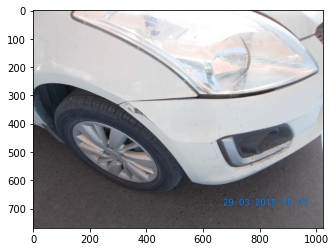

In [31]:
img_path = os.path.join('/mmdetection/data/coco_datasets/datasets/carpart_collection/images', img_names[4])
I = cv2.imread(img_path)
plt.imshow(I)